# Finance and Risk Analytics - Capstone Project

## Introduction

In the recent past, the industry of wealth management has seen a lot of growth. Every individual or business actively searches for opportunities to get the maximum returns. However, in most of the cases, they either lack the skills to identify the right investment opportunity, or there is a shortage of time for finding these opportunities. Hence, this gave rise to the dedicated individuals who perform this task on behalf of the investors for a commission - Portfolio managers.

 

A portfolio manager makes investment decisions and carries out other related activities on behalf of vested investors. They work with a team of analysts and researchers, and their main objective is to realise the needs of the investor and suggest a suitable portfolio that meets all the expectations. They are responsible for establishing the best investment strategy, selecting appropriate investments along with the right allocation. However, in doing so, they face a lot of competition in the form of other portfolio managers and rival firms. Therefore, the portfolio manager has to use the available resources to provide the best solution to the investor.

 

Consider yourself working for an associate at an investment firm that manages accounts for private clients. Your role requires you to analyse a portfolio of stocks to provide consultation on investment management based on client’s requirement. Let us hear more about it from Joydeep as he introduces you to the entire case.

## Business Objective


Being a Portfolio Manager our task is to present the conultation to two investors basedonheir requiremments and goals. The two Investors are Mr. Patrick Jyengar and Mr. Peter Jyengar


Our Objective is to:

- Provide a Portfolio of stocks to Mr. patric Jyengar, who wants to invest 500 thousand dollars for a period of 5 years. His objective is to gain the double the amoun at the end of 5 years with minimum risk possible. So that he can buy a minority stake in Naturo.
- Provide a hisgh risk stocks to Mr. Peter Jyemgar since he is handling acompany and need more investors for his organization. He is expecting a high risk high return for an investment. The amount he is expectig to invest is 1 million dollars for the period of five years as well.


## Data Description

The data has the following information for 24 stocks of leading companies listed in New York Stock Exchange(NYSE):

   - Date
   -  Open price: Price of stock at the start of the day
   - Close price: Price of stock at the end of the day
   - High price: Highest price reached by the stock on that day
   - Low price: Lowest price reached by the stock on that day
   - Adjusted close price: Stock price adjusted to include the annual returns (dividends) that the company offers to the shareholders
   - Volume traded: Number of stocks traded on the day

The information for every stock ranges from 1st October 2010 to 30th September 2020.
The stocks belong to different domains:

   - Technology/IT
   - Travel/Aviation/Hospitality
   - Banking/Financial Services and Insurance
   - Pharmaceuticals/Healthcare/Life Sciences

## Importing Python Libraries for the Analysis

In [1]:
# Import the required libraries


import numpy as np
import pandas as pd

from datetime import datetime
from scipy import stats

import matplotlib.pyplot as plt
import matplotlib.style as style
import seaborn as sns
%matplotlib inline


# Supress the Warnings
import warnings
warnings.filterwarnings('ignore')

In [2]:
# set max rows and max columns

pd.set_option('display.max_rows', 1000)
pd.set_option('display.max_columns', 1000)

### Reading the Data from several files


In [3]:
# Importing the dataset from all the stocks

# Aviation Stocks

american_airlines = pd.read_csv("Aviation/AAL.csv")
allegiant_travels = pd.read_csv("Aviation/ALGT.csv")
alaska_airgroup = pd.read_csv("Aviation/ALk.csv")
delta_airlines = pd.read_csv("Aviation/DAL.csv")
hawaiian_holdings = pd.read_csv("Aviation/HA.csv")
southwest_airlines = pd.read_csv("Aviation/LUV.csv")

# Finance Stocks

barclays  = pd.read_csv("Finance/BCS.csv")
credit_suisse  = pd.read_csv("Finance/CS.csv")
deutsche_bank  = pd.read_csv("Finance/DB.csv")
goldman_sachs  = pd.read_csv("Finance/GS.csv")
morgan_stanley  = pd.read_csv("Finance/MS.csv")
wells_fargo  = pd.read_csv("Finance/WFC.csv")

# Pharma_heathcare Stocks

johnson_n_johnson  = pd.read_csv("Pharma_Healthcare/JNJ.csv")
merck_nco  = pd.read_csv("Pharma_Healthcare/MRK.csv")
pfizer  = pd.read_csv("Pharma_Healthcare/PFE.csv")
united_healthgroup  = pd.read_csv("Pharma_Healthcare/UNH.csv")
bausche_health = pd.read_csv('Pharma_Healthcare/BHC.csv')
roche_holding = pd.read_csv('Pharma_Healthcare/RHHBY.csv')


# Technology Stocks
apple  = pd.read_csv("Technology/AAPL.csv")
amazon  = pd.read_csv("Technology/AMZN.csv")
facebook  = pd.read_csv("Technology/FB.csv")
alphabet  = pd.read_csv("Technology/GOOG.csv")
ibm  = pd.read_csv("Technology/IBM.csv")
microsoft  = pd.read_csv("Technology/MSFT.csv")

# S&P500 Stocks

sp500 = pd.read_csv("S&P500.csv")

In [4]:
apple.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,01-10-2010,10.219643,10.235000,10.048214,10.090000,8.719163,448142800
1,04-10-2010,10.057143,10.103572,9.920357,9.951428,8.599421,435302000
2,05-10-2010,10.071428,10.337500,10.065000,10.319285,8.917298,501967200
3,06-10-2010,10.342500,10.428214,10.187857,10.328215,8.925013,670868800
4,07-10-2010,10.369286,10.374286,10.246786,10.329286,8.925941,408399600


### Renaming the columns for each file will give the individaul colum identity

##### Since we will be using the Close colume in future, we rename it with the company abberviation only


In [5]:
# Create the dictionary of abbreviations and the dataframes to rename the columns of each dataframe

# ABBREAVIATION ADDED IN DICT

abbreviate = {'american_airlines':['AAL',american_airlines],
            'allegiant_travels':['ALGT',allegiant_travels],
            'alaska_airgroup':['ALK', alaska_airgroup],
            'delta_airlines':['DAL', delta_airlines],
            'hawaiian_holdings':['HA',hawaiian_holdings] ,
            'southwest_airlines':['LUV', southwest_airlines],
            'barclays':['BCS', barclays] ,
            'credit_suisse':['CS', credit_suisse],
            'deutsche_bank':['DB',deutsche_bank ],
            'goldman_sachs':['GS', goldman_sachs ],
            'morgan_stanley':['MS', morgan_stanley] ,
            'wells_fargo':['WFC', wells_fargo] ,
            'johnson_n_johnson':['JNJ', johnson_n_johnson ],
            'merck_nco':['MRK',merck_nco] ,
            'pfizer':['PFE', pfizer] ,
            'united_healthgroup':['UNH', united_healthgroup] ,
            'bausche_health':['BHC', bausche_health] ,
            'roche_holding':['RHHBY', roche_holding]  ,
            'apple':['AAPL', apple] ,
            'amazon':['AMZN', amazon] ,
            'facebook':['FB', facebook ],
            'alphabet':['GOOG', alphabet] ,
            'ibm':['IBM', ibm] ,
            'microsoft':['MSFT' ,microsoft],
            'sp500' :['S&P500',sp500]
             }

In [6]:
abbreviate['american_airlines']

['AAL',
             Date   Open   High    Low  Close  Adj Close    Volume
 0     01-10-2010   9.29   9.39   9.21   9.29   8.758067   3603800
 1     04-10-2010   9.24   9.48   9.05   9.12   8.597802   3856800
 2     05-10-2010   9.27   9.35   9.15   9.23   8.701504   3896600
 3     06-10-2010   9.27   9.40   9.15   9.23   8.701504   3230200
 4     07-10-2010   9.30   9.31   9.07   9.24   8.710930   3877700
 ...          ...    ...    ...    ...    ...        ...       ...
 2512  24-09-2020  11.74  12.00  11.22  11.77  11.770000  49163200
 2513  25-09-2020  11.76  12.31  11.71  12.29  12.290000  43764000
 2514  28-09-2020  12.74  13.15  12.49  12.76  12.760000  63558200
 2515  29-09-2020  12.59  12.66  12.11  12.25  12.250000  46994300
 2516  30-09-2020  12.32  12.92  12.22  12.29  12.290000  65055100
 
 [2517 rows x 7 columns]]

In [7]:
# for i, k  in abbreviate.items():
#     print(i,k)
#     print(k[1].columns)

In [8]:
# We loop through all the dataframes of teh stocks to renme the column names according to the abbervaitions

for i,j in abbreviate.items(): 
#     print(i,j,k)# 'american_airlines.columns' take as a reference for the columns names
    for k in j[1].columns:
        if k == 'Date':
            continue
        elif k == 'Close':
    #         i = i.rename(american_airlines.columns[1:], inplace = False)
            j[1].rename(columns={k:j[0]},inplace=True)
        else:
            j[1].rename(columns={k:j[0] +'_' + k},inplace=True)

        

In [9]:
sp500

,Date,S&P500_Open,S&P500_High,S&P500_Low,S&P500,S&P500_Adj Close,S&P500_Volume
0,01-10-2010,1143.489990,1150.300049,1139.420044,1146.239990,1146.239990,4298910000
1,04-10-2010,1144.959961,1148.160034,1131.869995,1137.030029,1137.030029,3604110000
2,05-10-2010,1140.680054,1162.760010,1140.680054,1160.750000,1160.750000,4068840000
3,06-10-2010,1159.810059,1162.329956,1154.849976,1159.969971,1159.969971,4073160000
4,07-10-2010,1161.569946,1163.869995,1151.410034,1158.060059,1158.060059,3910550000
...,...,...,...,...,...,...,...
2512,24-09-2020,3226.139893,3278.699951,3209.449951,3246.590088,3246.590088,4599470000
2513,25-09-2020,3236.659912,3306.879883,3228.439941,3298.459961,3298.459961,3792220000
2514,28-09-2020,3333.899902,3360.739990,3332.909912,3351.600098,3351.600098,3946060000
2515,29-09-2020,3350.919922,3357.919922,3327.540039,3335.469971,3335.469971,3651880000


##  Considering only the 'Close' values from all the stock trends


In [10]:
# Considering only the 'Close' values from all the stock trends


# S&P500 index
SP500 = sp500[['Date','S&P500']]

# Aviation stocks
AAL = american_airlines[['Date','AAL']]
ALGT = allegiant_travels[['Date','ALGT']]
ALK = alaska_airgroup[['Date','ALK']]
DAL = delta_airlines[['Date','DAL']]
HA = hawaiian_holdings[['Date','HA']]
LUV = southwest_airlines[['Date','LUV']]

# Finance stocks
BCS = barclays[['Date','BCS']]
CS = credit_suisse[['Date','CS']]
DB = deutsche_bank[['Date','DB']]
GS = goldman_sachs[['Date','GS']]
MS = morgan_stanley[['Date','MS']]
WFC = wells_fargo[['Date','WFC']]

# Pharma_healthcare stocks

JNJ = johnson_n_johnson[['Date','JNJ']]
MRK = merck_nco[['Date','MRK']]
PFE = pfizer[['Date','PFE']]
UNH = united_healthgroup[['Date','UNH']]
BHC = bausche_health[['Date','BHC']]
RHHBY = roche_holding[['Date','RHHBY']]



# Technology stocks
AAPL = apple[['Date','AAPL']]
AMZN = amazon[['Date','AMZN']]
FB = facebook[['Date','FB']]
GOOG = alphabet[['Date','GOOG']]
IBM = ibm[['Date','IBM']]
MSFT = microsoft[['Date','MSFT']]

In [11]:
MSFT.head()

,Date,MSFT
0,01-10-2010,24.379999
1,04-10-2010,23.910000
2,05-10-2010,24.350000
3,06-10-2010,24.430000
4,07-10-2010,24.530001


## Merging all the data using inner join on date column


In [12]:
data_frame = [SP500, AAL,ALGT,ALK,DAL,HA ,LUV, BCS ,CS ,DB, 
              GS ,MS, WFC ,JNJ, MRK ,PFE ,UNH, BHC, RHHBY ,
              AAPL, AMZN, FB, GOOG, IBM ,MSFT ]



In [13]:
# compile the list of dataframes you want to merge
# data_frames = [df1, df2, df3]
import pandas as pd
from functools import reduce

for i in data_frame:
    stock_data = reduce(lambda  stock_data,i: pd.merge(stock_data,i,on=['Date'],
                                            how='inner'), data_frame)
    
# df_merged = reduce(lambda  left,right: pd.merge(left,right,on=['DATE'],
#                                             how='outer'), data_frames)

# # if you want to fill the values that don't exist in the lines of merged dataframe simply fill with required strings as



In [14]:
stock_data

,Date,S&P500,AAL,ALGT,ALK,DAL,HA,LUV,BCS,CS,DB,GS,MS,WFC,JNJ,MRK,PFE,UNH,BHC,RHHBY,AAPL,AMZN,FB,GOOG,IBM,MSFT
0,18-05-2012,1295.219971,10.06,62.310001,16.170000,10.140000,5.28,8.150000,10.285714,19.169922,34.370228,95.489998,13.350000,30.940001,63.349998,37.820000,22.570000,53.990002,47.029999,20.160000,18.942142,213.850006,38.230000,299.078979,195.880005,29.270000
1,21-05-2012,1315.989990,10.71,62.660000,16.379999,10.580000,5.32,8.340000,10.672812,19.541016,35.505726,96.510002,13.190000,31.400000,63.470001,37.599998,22.540001,55.549999,47.189999,20.389999,20.045713,218.110001,34.029999,305.908386,197.759995,29.750000
2,22-05-2012,1316.630005,10.62,62.349998,16.225000,10.540000,5.23,8.270000,10.857142,19.863281,35.410305,97.529999,13.310000,31.670000,63.520000,37.459999,22.370001,55.720001,47.779999,20.430000,19.891787,215.330002,31.000000,299.278229,196.820007,29.760000
3,23-05-2012,1318.859985,11.00,62.990002,16.115000,10.740000,5.38,8.360000,10.737328,19.765625,35.381680,98.040001,13.370000,31.740000,63.270000,37.340000,22.090000,55.360001,46.650002,20.075001,20.377142,217.279999,32.000000,303.592072,196.119995,29.110001
4,24-05-2012,1320.680054,12.16,64.250000,16.920000,11.270000,5.68,8.740000,10.746544,19.658203,34.828243,96.860001,13.310000,31.809999,63.099998,37.599998,22.139999,56.220001,48.040001,19.855000,20.190001,215.240005,33.029999,300.702881,196.089996,29.070000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2101,24-09-2020,3246.590088,11.77,121.500000,35.700001,29.010000,12.40,36.860001,4.750000,9.620000,8.110000,195.110001,46.610001,23.320000,144.669998,83.150002,35.759998,292.660004,15.220000,44.700001,108.220001,3019.790039,249.529999,1428.290039,118.089996,203.190002
2102,25-09-2020,3298.459961,12.29,123.760002,36.700001,29.780001,12.80,37.099998,4.700000,9.480000,8.000000,194.949997,47.040001,23.639999,145.660004,82.930000,36.049999,302.500000,15.300000,44.820000,112.279999,3095.129883,254.820007,1444.959961,118.949997,207.820007
2103,28-09-2020,3351.600098,12.76,127.110001,37.540001,31.340000,13.38,38.240002,4.990000,9.900000,8.430000,199.070007,48.380001,23.820000,147.110001,82.760002,36.389999,303.230011,15.270000,44.110001,114.959999,3174.050049,256.820007,1464.520020,121.730003,209.440002
2104,29-09-2020,3335.469971,12.25,121.089996,36.669998,30.610001,12.86,37.610001,4.960000,9.830000,8.270000,196.789993,47.240002,23.260000,147.059998,81.900002,36.169998,304.149994,14.880000,43.369999,114.089996,3144.879883,261.790009,1469.329956,120.940002,207.259995


## Exploratory Data Analysis

In [15]:
# Number of rows and columns
stock_data.shape

(2106, 26)

In [16]:
# Columns in the dataset

stock_data.columns

Index(['Date', 'S&P500', 'AAL', 'ALGT', 'ALK', 'DAL', 'HA', 'LUV', 'BCS', 'CS',
       'DB', 'GS', 'MS', 'WFC', 'JNJ', 'MRK', 'PFE', 'UNH', 'BHC', 'RHHBY',
       'AAPL', 'AMZN', 'FB', 'GOOG', 'IBM', 'MSFT'],
      dtype='object')

In [17]:
# Instepcting the numerical columns
stock_data.describe()

,S&P500,AAL,ALGT,ALK,DAL,HA,LUV,BCS,CS,DB,GS,MS,WFC,JNJ,MRK,PFE,UNH,BHC,RHHBY,AAPL,AMZN,FB,GOOG,IBM,MSFT
count,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000
mean,2273.892283,33.552859,133.642911,56.696432,40.479141,26.177854,38.977840,11.822157,19.199134,23.418093,188.979198,36.923936,47.520798,113.375522,61.404653,33.580147,159.649582,65.469117,32.943830,37.230219,984.016083,119.599425,816.281595,159.660071,76.196852
std,534.027978,13.036814,35.668011,20.649972,14.673069,14.808009,16.480813,3.736298,7.109165,13.237359,38.409585,10.838003,8.998725,23.369759,12.786464,4.930604,81.072224,61.730865,4.905682,20.480593,749.076388,63.839134,337.218474,25.113899,47.698636
min,1278.040039,9.040000,62.259998,16.115000,8.550000,5.220000,8.150000,3.840000,6.670000,5.480000,91.000000,12.360000,22.530001,61.779999,37.180000,21.600000,51.000000,8.510000,19.430000,13.947500,208.220001,17.730000,278.481171,94.769997,26.370001
25%,1895.847473,22.792499,109.180000,38.462500,30.582500,13.132500,26.875001,8.892500,13.192500,11.220000,162.255001,29.365001,43.627500,97.940002,52.980000,30.282501,81.502500,20.567500,30.526250,23.573750,331.909996,68.429998,536.690002,141.279999,41.272500
50%,2132.765014,36.365000,136.060005,62.570002,45.315000,25.920001,41.850001,10.940000,16.304296,18.740000,189.885002,37.295000,49.770000,114.684998,58.965000,33.590000,138.119995,28.490000,32.514999,30.137500,743.445007,118.680000,759.674988,155.095001,56.494999
75%,2736.487549,43.465001,159.899994,69.169998,51.552501,38.437501,53.024999,15.387500,26.477500,34.647500,219.892494,45.657500,54.097499,132.887500,68.764998,36.340000,240.174996,105.919998,35.700001,45.233126,1643.132507,173.980003,1101.962494,182.865005,104.955002
max,3580.840088,58.470001,233.979996,100.239998,63.160000,60.299999,66.290001,19.580000,33.840000,51.898853,273.380005,58.910000,65.930000,155.509995,92.040001,46.230000,323.700012,262.519989,46.840000,134.179993,3531.449951,303.910004,1728.280029,215.800003,231.649994


In [18]:
# Datatypes of all teh columns
stock_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2106 entries, 0 to 2105
Data columns (total 26 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Date    2106 non-null   object 
 1   S&P500  2106 non-null   float64
 2   AAL     2106 non-null   float64
 3   ALGT    2106 non-null   float64
 4   ALK     2106 non-null   float64
 5   DAL     2106 non-null   float64
 6   HA      2106 non-null   float64
 7   LUV     2106 non-null   float64
 8   BCS     2106 non-null   float64
 9   CS      2106 non-null   float64
 10  DB      2106 non-null   float64
 11  GS      2106 non-null   float64
 12  MS      2106 non-null   float64
 13  WFC     2106 non-null   float64
 14  JNJ     2106 non-null   float64
 15  MRK     2106 non-null   float64
 16  PFE     2106 non-null   float64
 17  UNH     2106 non-null   float64
 18  BHC     2106 non-null   float64
 19  RHHBY   2106 non-null   float64
 20  AAPL    2106 non-null   float64
 21  AMZN    2106 non-null   float64
 22  

###  From above we can say that the DATE in the dataset is in object datatype, we have to chande it itn datatime format
Also looking at the value counts we can see that there is no missing data in any of the columns of the dataset , thus we will go along with dataset without treatig for a
ny missing values data

In [19]:
# Changing the date format into Datetime

stock_data["Date"]= pd.to_datetime(stock_data["Date"], format='%d-%m-%Y')

# Checking the data type
stock_data.dtypes

Date      datetime64[ns]
S&P500           float64
AAL              float64
ALGT             float64
ALK              float64
DAL              float64
HA               float64
LUV              float64
BCS              float64
CS               float64
DB               float64
GS               float64
MS               float64
WFC              float64
JNJ              float64
MRK              float64
PFE              float64
UNH              float64
BHC              float64
RHHBY            float64
AAPL             float64
AMZN             float64
FB               float64
GOOG             float64
IBM              float64
MSFT             float64
dtype: object

### Converting the date column into Index of the dataset

In [20]:
# Converting teh date column into Index of the datasset
stock_data = stock_data.set_index('Date')

stock_data.head()

,S&P500,AAL,ALGT,ALK,DAL,HA,LUV,BCS,CS,DB,GS,MS,WFC,JNJ,MRK,PFE,UNH,BHC,RHHBY,AAPL,AMZN,FB,GOOG,IBM,MSFT
Date,,,,,,,,,,,,,,,,,,,,,,,,,
2012-05-18,1295.219971,10.06,62.310001,16.170000,10.14,5.28,8.15,10.285714,19.169922,34.370228,95.489998,13.35,30.940001,63.349998,37.820000,22.570000,53.990002,47.029999,20.160000,18.942142,213.850006,38.230000,299.078979,195.880005,29.270000
2012-05-21,1315.989990,10.71,62.660000,16.379999,10.58,5.32,8.34,10.672812,19.541016,35.505726,96.510002,13.19,31.400000,63.470001,37.599998,22.540001,55.549999,47.189999,20.389999,20.045713,218.110001,34.029999,305.908386,197.759995,29.750000
2012-05-22,1316.630005,10.62,62.349998,16.225000,10.54,5.23,8.27,10.857142,19.863281,35.410305,97.529999,13.31,31.670000,63.520000,37.459999,22.370001,55.720001,47.779999,20.430000,19.891787,215.330002,31.000000,299.278229,196.820007,29.760000
2012-05-23,1318.859985,11.00,62.990002,16.115000,10.74,5.38,8.36,10.737328,19.765625,35.381680,98.040001,13.37,31.740000,63.270000,37.340000,22.090000,55.360001,46.650002,20.075001,20.377142,217.279999,32.000000,303.592072,196.119995,29.110001
2012-05-24,1320.680054,12.16,64.250000,16.920000,11.27,5.68,8.74,10.746544,19.658203,34.828243,96.860001,13.31,31.809999,63.099998,37.599998,22.139999,56.220001,48.040001,19.855000,20.190001,215.240005,33.029999,300.702881,196.089996,29.070000


### Investment for 5 years

- Accoring to the Information provided, the client want to invest for the period of 5 years.
- Since we are given the data for the period of 10 years we will analyse the data for 5 years and predict for the next 5 years


In [21]:
# here we need to analyse the data for last 5 years and predict for next 5 years
# i.e. as the client is looking for an investment period of 5 years
stock_data = stock_data['10-01-2015':]
stock_data.head()

,S&P500,AAL,ALGT,ALK,DAL,HA,LUV,BCS,CS,DB,GS,MS,WFC,JNJ,MRK,PFE,UNH,BHC,RHHBY,AAPL,AMZN,FB,GOOG,IBM,MSFT
Date,,,,,,,,,,,,,,,,,,,,,,,,,
2015-10-01,1923.819946,39.200001,217.979996,80.230003,45.410000,24.730000,38.410000,15.01,24.090000,26.520000,176.020004,31.500000,51.439999,93.169998,49.369999,31.840000,116.610001,179.600006,33.220001,27.395000,520.719971,90.949997,611.289978,143.589996,44.610001
2015-10-02,1951.359985,38.630001,215.589996,79.260002,44.869999,24.280001,38.380001,15.39,24.639999,27.139999,177.009995,31.430000,51.259998,93.930000,50.139999,33.080002,118.830002,182.320007,33.320000,27.594999,532.539978,92.070000,626.909973,144.580002,45.570000
2015-10-05,1987.050049,40.189999,216.059998,80.910004,46.959999,25.500000,39.299999,15.60,25.160000,28.200001,180.699997,32.290001,52.410000,94.760002,51.230000,33.480000,119.650002,163.460007,33.439999,27.695000,543.679993,94.010002,641.469971,149.039993,46.630001
2015-10-06,1979.920044,38.130001,208.600006,74.529999,45.090000,24.250000,38.000000,15.55,25.379999,28.400000,180.320007,32.360001,52.029999,93.419998,49.799999,32.790001,116.050003,166.000000,33.529999,27.827499,537.479980,92.800003,645.440002,148.779999,46.750000
2015-10-07,1995.829956,39.310001,213.839996,75.970001,45.990002,24.559999,38.709999,15.73,25.320000,28.790001,182.229996,32.930000,52.189999,94.980003,50.950001,33.290001,116.430000,169.830002,32.549999,27.695000,541.940002,92.400002,642.359985,150.089996,46.799999


### Checking for the null values in the data


In [22]:
# Checking for null values

stock_data.isnull().sum()*100/stock_data.shape[0]

S&P500    0.0
AAL       0.0
ALGT      0.0
ALK       0.0
DAL       0.0
HA        0.0
LUV       0.0
BCS       0.0
CS        0.0
DB        0.0
GS        0.0
MS        0.0
WFC       0.0
JNJ       0.0
MRK       0.0
PFE       0.0
UNH       0.0
BHC       0.0
RHHBY     0.0
AAPL      0.0
AMZN      0.0
FB        0.0
GOOG      0.0
IBM       0.0
MSFT      0.0
dtype: float64

### Since we have checked all the aspects of the dataset and have cleaned the data , we can save the cleaned dataset


In [23]:
# Exporting the dataset in the .csv format

stock_data.to_csv('Final_Stock_Data.csv')

## Normalizing the Dataset

In [24]:
from sklearn.preprocessing import MinMaxScaler


# copy the data for normalization
stock_data_normalized = stock_data.copy()


# For normlaization we use MinMaxScaler

scaler = MinMaxScaler()

# Transforming the data 
fit_value = scaler.fit_transform(stock_data_normalized.iloc[:])

# applying normalized value to the data
stock_data_normalized.iloc[:] = fit_value

In [25]:
stock_data_normalized.head()

,S&P500,AAL,ALGT,ALK,DAL,HA,LUV,BCS,CS,DB,GS,MS,WFC,JNJ,MRK,PFE,UNH,BHC,RHHBY,AAPL,AMZN,FB,GOOG,IBM,MSFT
Date,,,,,,,,,,,,,,,,,,,,,,,,,
2015-10-01,0.054083,0.610156,0.938873,0.739045,0.596316,0.311593,0.342763,0.933166,0.903059,0.832608,0.296583,0.263568,0.666129,0.000000,0.017952,0.188839,0.034410,0.984351,0.333985,0.043102,0.012675,0.000000,0.000000,0.559991,0.000000
2015-10-02,0.069804,0.598624,0.924086,0.726395,0.584035,0.302884,0.342056,0.964912,0.931571,0.857143,0.303735,0.261687,0.661982,0.012191,0.035673,0.258737,0.044761,1.000000,0.338875,0.044894,0.016551,0.005259,0.013984,0.571347,0.005133
2015-10-05,0.090178,0.630184,0.926994,0.747913,0.631567,0.326495,0.363743,0.982456,0.958528,0.899090,0.330395,0.284793,0.688479,0.025505,0.060759,0.281285,0.048585,0.891491,0.344743,0.045791,0.020204,0.014369,0.027019,0.622505,0.010800
2015-10-06,0.086108,0.588509,0.880839,0.664710,0.589038,0.302303,0.333098,0.978279,0.969933,0.907004,0.327650,0.286674,0.679723,0.004010,0.027848,0.242390,0.031799,0.906104,0.349144,0.046978,0.018171,0.008687,0.030573,0.619523,0.011441
2015-10-07,0.095190,0.612381,0.913259,0.683490,0.609507,0.308303,0.349835,0.993317,0.966822,0.922438,0.341449,0.301988,0.683410,0.029034,0.054315,0.270575,0.033571,0.928140,0.301222,0.045791,0.019633,0.006809,0.027816,0.634549,0.011709


In [26]:
# Exporting the dataset in the .csv format

stock_data_normalized.to_csv('Final_Stock_Data_Normalized.csv')

# Data Visualization

###  For visualization we used Tableau for the interactiveness of the charts. Visualizing the Stock Vlaues across all the sector as well as visualizing individual sectors



In [27]:
# import chart_studio.plotly as py
import plotly.graph_objs as go
from plotly.offline import iplot, init_notebook_mode

# Using plotly + cufflinks in offline mode
import cufflinks
cufflinks.go_offline(connected=True)
init_notebook_mode(connected=True)

## Actual Stock Analysis

In [28]:
# Plotting the Stock Data for all the sectors except S&P500


import plotly.express as px
import pandas as pd

# Plotting the the stock data
def plot_data(data, all_values = True):
    
    fig = px.line(data, x=data.index, y=data.columns[1:], title='Actual Stock Data Visualization')

# Adding the All Button to the Dropdown menu
    for column in data.columns.to_list()[1:]:
        button_all = dict(label = 'All',
                          method = 'update',
                          args = [{'visible': data.columns[1:].isin(data.columns[1:].to_list()),
                                   'title': 'All',
                                   'showlegend':True}])
# Creating the Dropdown menu for all the stock values
    def dropdown_buttons(column):
        return dict(label = column,
                    method = 'update',
                    args = [{'visible': data.columns[1:].isin([column]),
                             'title': column,
          
                             'showlegend': True}])
    
# Updating the grapgh with each dropdown option 
    fig.update_layout(
    updatemenus=[go.layout.Updatemenu(
        active = 0,
        buttons = ([button_all] * all_values) + list(data.columns[1:].map(lambda column: dropdown_buttons(column)))
                    )
                    ])
# Adding the RangeSlider to our chart
    fig.update_layout(title_text="Actual Stock Data Visualization",
                      xaxis_rangeslider_visible=True)
    fig.show()


In [29]:
plot_data(stock_data)

 ### Insights
    - Amazon and Google are the two comapnies which are trailing all the other companies mentioned in the data
    - The trend has been consistent over the five years.

## Normalized Stock Analysis

In [30]:
# Taking into consideration the Market Index Value to compare with other values:


import plotly.express as px
import pandas as pd

# Plotting the the stock data
def plot_data_sp500(data, all_values = True):
    
    fig = px.line(data, x=data.index, y=data.columns, title='Normalized Stock Data Visualization')

# Adding the All Button to the Dropdown menu
    for column in data.columns.to_list():
        button_all = dict(label = 'All',
                          method = 'update',
                          args = [{'visible': data.columns.isin(data.columns.to_list()),
                                   'title': 'All',
                                   'showlegend':True}])
# Creating the Dropdown menu for all the stock values
    def dropdown_buttons(column):
        return dict(label = column,
                    method = 'update',
                    args = [{'visible': data.columns.isin([column]),
                             'title': column,
          
                             'showlegend': True}])
    
# Updating the grapgh with each dropdown option 
    fig.update_layout(
    updatemenus=[go.layout.Updatemenu(
        active = 0,
        buttons = ([button_all] * all_values) + list(data.columns.map(lambda column: dropdown_buttons(column)))
                    )
                    ])
# Adding the RangeSlider to our chart
    fig.update_layout(title_text="Normalized Stock Data Visualization",
                      xaxis_rangeslider_visible=True)
    fig.show()


In [31]:
plot_data_sp500(stock_data_normalized)

### Insight:

Normalized Stock Analysis
 - By the end of the 5 year, we see some of the stocks like United Health, johnson and H=Johnson, Microsot, Amazon, Apple,         Google,Morgan and Stanley, Merck and Company, Rosch and Holding gaining value about more tha 70 %.
    
    


# Analysing each domain separately

## Aviation

In [32]:
# Aviation Stocks

aviation = stock_data_normalized[['S&P500','ALGT','AAL','ALK','DAL','HA','LUV']]

aviation.head()

,S&P500,ALGT,AAL,ALK,DAL,HA,LUV
Date,,,,,,,
2015-10-01,0.054083,0.938873,0.610156,0.739045,0.596316,0.311593,0.342763
2015-10-02,0.069804,0.924086,0.598624,0.726395,0.584035,0.302884,0.342056
2015-10-05,0.090178,0.926994,0.630184,0.747913,0.631567,0.326495,0.363743
2015-10-06,0.086108,0.880839,0.588509,0.664710,0.589038,0.302303,0.333098
2015-10-07,0.095190,0.913259,0.612381,0.683490,0.609507,0.308303,0.349835


In [33]:
# Exporting the dataset in the .csv format

aviation.to_csv('Aviation.csv')

In [34]:
plot_data_sp500(aviation)

In [35]:
# Pairplot to visualize the correlation between the index column as well as within eachother

# sns.pairplot(aviation, kind = 'scatter')
# plt.show()

In [36]:
# Checking the correlations for Aviation stocks

correlated_data = aviation.corr(method='pearson')

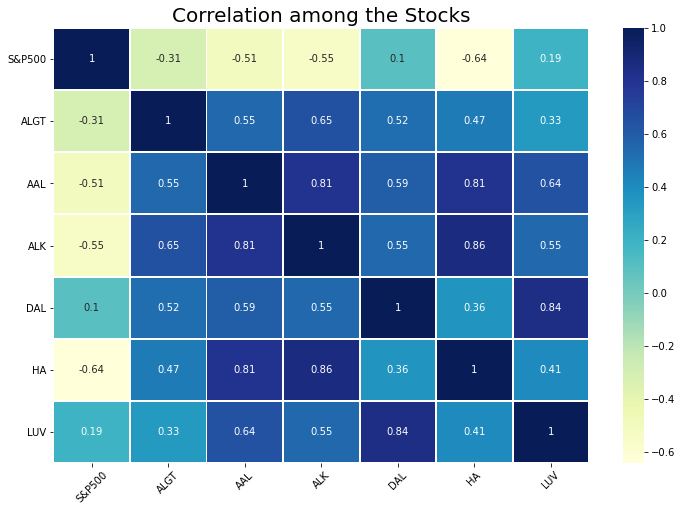

In [37]:

plt.figure(figsize = (12,8))
sns.heatmap(correlated_data, cmap='YlGnBu', annot = True, linewidths=1.0)
plt.yticks(rotation=0) 
plt.xticks(rotation=45) 
plt.title('Correlation among the Stocks', fontsize = 20)
plt.show()

### Insights

Aviation Stocks

    -  All the Stocks in the aviation secor has experienced downfall as we can see from the chart. Since March 2020 there is steep curve in all the stock grahs,this can be because of the Corona Pandemic situation across the World.
    
    -  The Stock prices for 'Delta Air Lines' Inc and 'Southwest Airlines Co' are seen to be correlated while 'Allegiant Travel Company' and 'American Airlines Group Inc' are less negatively correlated.
    

## Finance

In [38]:
# Finance Stocks

finance = stock_data_normalized[['S&P500','BCS','CS','DB','GS','MS','WFC']]

finance.head()

,S&P500,BCS,CS,DB,GS,MS,WFC
Date,,,,,,,
2015-10-01,0.054083,0.933166,0.903059,0.832608,0.296583,0.263568,0.666129
2015-10-02,0.069804,0.964912,0.931571,0.857143,0.303735,0.261687,0.661982
2015-10-05,0.090178,0.982456,0.958528,0.899090,0.330395,0.284793,0.688479
2015-10-06,0.086108,0.978279,0.969933,0.907004,0.327650,0.286674,0.679723
2015-10-07,0.095190,0.993317,0.966822,0.922438,0.341449,0.301988,0.683410


In [39]:
# Exporting the dataset in the .csv format

finance.to_csv('Finance.csv')

In [40]:
# plotting the chart 

plot_data_sp500(finance)

In [41]:
# Pairplot to visualize the correlation between the index column as well as within eachother

# sns.pairplot(finance, kind = 'scatter')
# plt.show()

In [42]:
# Checking the correlations for Finance stocks

correlated_data = finance.corr(method='pearson')

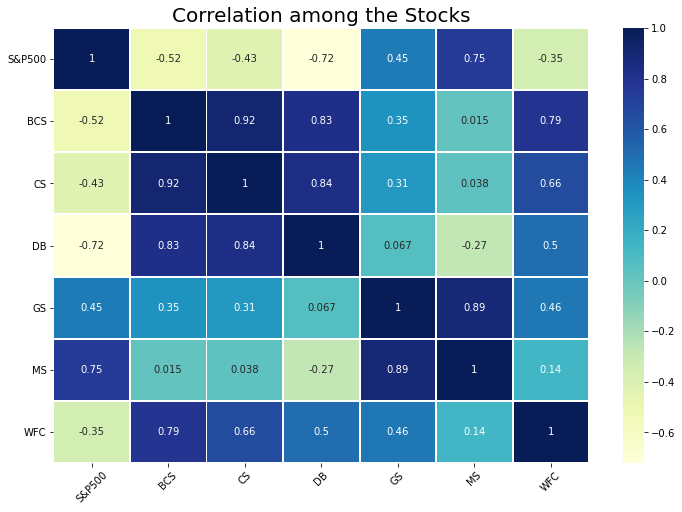

In [43]:
plt.figure(figsize = (12,8))
sns.heatmap(correlated_data, cmap='YlGnBu', annot = True,linewidths=1.0)
plt.yticks(rotation=0) 
plt.xticks(rotation=45) 
plt.title('Correlation among the Stocks', fontsize = 20)
plt.show()

### Insights

Finance Stocks

    -  Morgan Stanley & Goldman Sachs seems to perfrom well comapred to other stocks.
    
    - Deutsche Bank with coorelation of -0.52 and Barclays with the correlation of -0.72 are seen to be least performers at the end of 
    the analysis chart.




## Pharma Healthcare

In [44]:
# Pharma_Heathcare Stocks

pharma_heathcare = stock_data_normalized[['S&P500','BHC','JNJ','MRK','PFE','RHHBY','UNH']]

pharma_heathcare.head()

,S&P500,BHC,JNJ,MRK,PFE,RHHBY,UNH
Date,,,,,,,
2015-10-01,0.054083,0.984351,0.000000,0.017952,0.188839,0.333985,0.034410
2015-10-02,0.069804,1.000000,0.012191,0.035673,0.258737,0.338875,0.044761
2015-10-05,0.090178,0.891491,0.025505,0.060759,0.281285,0.344743,0.048585
2015-10-06,0.086108,0.906104,0.004010,0.027848,0.242390,0.349144,0.031799
2015-10-07,0.095190,0.928140,0.029034,0.054315,0.270575,0.301222,0.033571


In [45]:
# Exporting the dataset in the .csv format

pharma_heathcare.to_csv('Pharma_Healthcare.csv')

In [46]:
# Plotting the data

plot_data_sp500(pharma_heathcare)

In [47]:
# Pairplot to visualize the correlation between the index column as well as within eachother

# sns.pairplot(pharma_heathcare, kind = 'scatter')
# plt.show()

In [48]:
# Checking the correlations for Finance stocks

correlated_data = pharma_heathcare.corr(method='pearson')

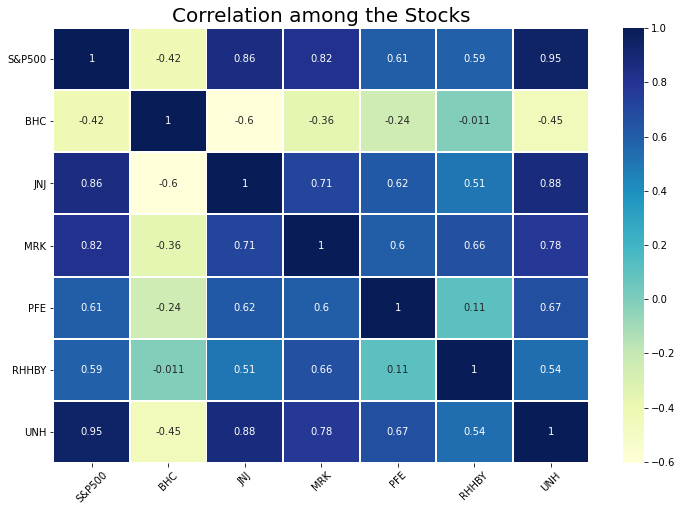

In [49]:
plt.figure(figsize = (12,8))
sns.heatmap(correlated_data, cmap='YlGnBu', annot = True,linewidths=1.0)
plt.yticks(rotation=0) 
plt.xticks(rotation=45) 
plt.title('Correlation among the Stocks', fontsize = 20)
plt.show()

### Insights 

Pharma_Health Stocks

    - Pharma & Health has been hit by the Pnademic as well but can be seen recovered at the fastest rate than any other sector
    
    - United Health, Johnson & Johsnson have performed well having the coorelation of 0.95 and 0.86 with the market index.
    
    - 'Bausch Health Companies inc' is seen to be performing badly over the years consistently.



## Technology

In [50]:
# Technology Stocks

technology = stock_data_normalized[['S&P500','AAPL','AMZN','FB','GOOG','IBM','MSFT']]

technology.head()

,S&P500,AAPL,AMZN,FB,GOOG,IBM,MSFT
Date,,,,,,,
2015-10-01,0.054083,0.043102,0.012675,0.000000,0.000000,0.559991,0.000000
2015-10-02,0.069804,0.044894,0.016551,0.005259,0.013984,0.571347,0.005133
2015-10-05,0.090178,0.045791,0.020204,0.014369,0.027019,0.622505,0.010800
2015-10-06,0.086108,0.046978,0.018171,0.008687,0.030573,0.619523,0.011441
2015-10-07,0.095190,0.045791,0.019633,0.006809,0.027816,0.634549,0.011709


In [51]:
# Exporting the dataset in the .csv format

technology.to_csv('Technology.csv')

In [52]:
# Ploting the data

plot_data_sp500(technology)

In [53]:
# Pairplot to visualize the correlation between the index column as well as within eachother

# sns.pairplot(technology, kind = 'scatter')
# plt.show()

In [54]:
# Checking the correlations for Finance stocks

correlated_data = technology.corr(method='pearson')

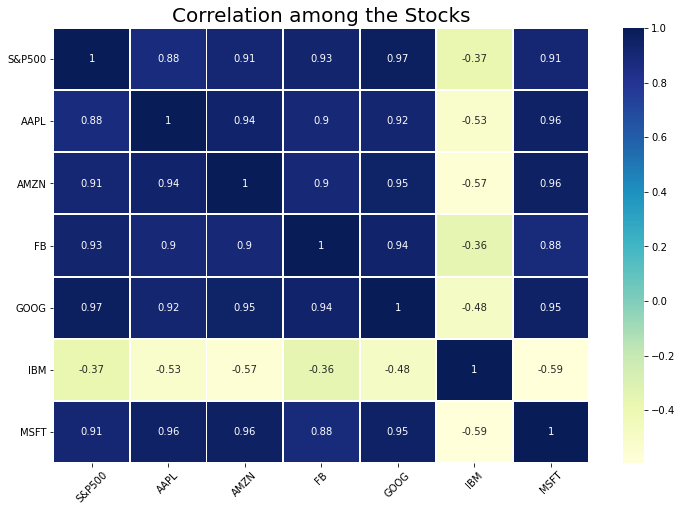

In [55]:
plt.figure(figsize = (12,8))
sns.heatmap(correlated_data, cmap='YlGnBu', annot = True,linewidths=1.0)
plt.yticks(rotation=0) 
plt.xticks(rotation=45) 
plt.title('Correlation among the Stocks', fontsize = 20)
plt.show()

### Insights

Technology Stocks

    - Technology Sector is also seen performed badly during the Pandamic but has been recovered well along the way better than the Pharma healthcare Sector
    
    - The companies which has performed well along teh market index are Microsoft, Amazon, Apple, Facebook & Google.
    
    - Whereas we see that IBM has performed badly consistently over the years.


# Metrics Calculation

### Daily Returns

Daily return is the percentage change in the price of the stock from the previous day. This can be calculated using the percentage change in the price on a daily basis.

In [56]:
# Calculating Daily Returns

daily_returns = stock_data.copy()

# Calculate percentage change

for i in list(daily_returns.columns):
    daily_returns[i]=daily_returns[i].pct_change(1)  # % change in each element
    daily_returns

In [57]:
plot_data(daily_returns)

In [58]:
#correlation for the daily returns 

daily_returns_corr = daily_returns.corr(method='pearson')

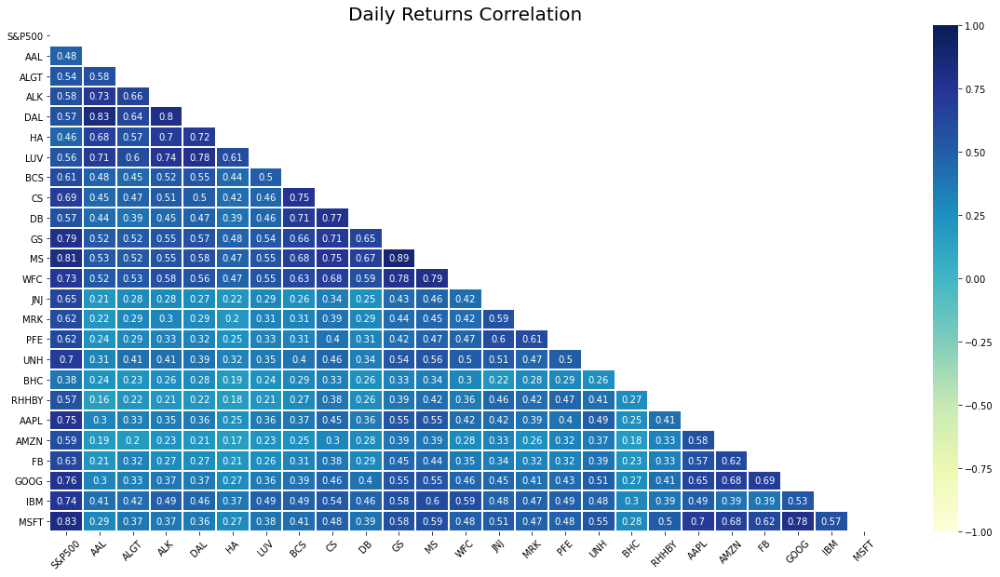

In [59]:
# Plotting the heatmap

plt.figure(figsize=(20,10))

mask = np.zeros_like(daily_returns_corr)
mask[np.triu_indices_from(mask)] = True

sns.heatmap(daily_returns_corr, annot = True, cmap='YlGnBu', vmax=1.0, vmin=-1.0 , mask = mask, linewidths=1.0)

plt.yticks(rotation=0) 
plt.xticks(rotation=45) 
plt.title('Daily Returns Correlation', fontsize = 20)
plt.show()

### Insights

From the above charts we san say that,

- Aviation  -- Delta Airlines and American Airlines are more correlated with Alska Air Group at third rank
- Finance -- Goldman Sachs, Morgan Stanley & WellsFargo  are ranking higher correlation with the market index
- Pharma -- Jhonsons and Jo=honsons and Pzier are more correalted, Comapred to the Other sectors Pharma is less correlated with the maket index
- Technology -- Microsoft and Google are the highhly correlated stocks with Amazon in the third rank


## Average Daily Returns

In [60]:
# Average daily return from each stock

avg_daily_returns = daily_returns.mean()
avg_daily_returns

S&P500    0.000517
AAL      -0.000336
ALGT     -0.000047
ALK      -0.000256
DAL       0.000042
HA        0.000034
LUV       0.000245
BCS      -0.000548
CS       -0.000437
DB       -0.000529
GS        0.000303
MS        0.000578
WFC      -0.000414
JNJ       0.000451
MRK       0.000511
PFE       0.000209
UNH       0.000941
BHC      -0.000897
RHHBY     0.000293
AAPL      0.001322
AMZN      0.001611
FB        0.001050
GOOG      0.000834
IBM      -0.000002
MSFT      0.001387
dtype: float64

## Cumulative Daily Returns

In [61]:
# Calculating cumulative Daily Returns

daily_returns_cum = (1 + daily_returns).cumprod() - 1

daily_returns_cum.head()

,S&P500,AAL,ALGT,ALK,DAL,HA,LUV,BCS,CS,DB,GS,MS,WFC,JNJ,MRK,PFE,UNH,BHC,RHHBY,AAPL,AMZN,FB,GOOG,IBM,MSFT
Date,,,,,,,,,,,,,,,,,,,,,,,,,
2015-10-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-10-02,0.014315,-0.014541,-0.010964,-0.012090,-0.011892,-0.018196,-0.000781,0.025316,0.022831,0.023379,0.005624,-0.002222,-0.003499,0.008157,0.015597,0.038945,0.019038,0.015145,0.003010,0.007301,0.022699,0.012314,0.025553,0.006895,0.021520
2015-10-05,0.032867,0.025255,-0.008808,0.008476,0.034133,0.031136,0.023171,0.039307,0.044417,0.063348,0.026588,0.025079,0.018857,0.017066,0.037675,0.051508,0.026070,-0.089866,0.006622,0.010951,0.044093,0.033645,0.049371,0.037955,0.045281
2015-10-06,0.029161,-0.027296,-0.043031,-0.071046,-0.007047,-0.019410,-0.010674,0.035976,0.053549,0.070890,0.024429,0.027302,0.011470,0.002683,0.008710,0.029837,-0.004802,-0.075724,0.009332,0.015788,0.032186,0.020341,0.055866,0.036145,0.047971
2015-10-07,0.037431,0.002806,-0.018993,-0.053097,0.012773,-0.006874,0.007810,0.047968,0.051059,0.085596,0.035280,0.045397,0.014580,0.019427,0.032003,0.045540,-0.001544,-0.054399,-0.020169,0.010951,0.040751,0.015943,0.050827,0.045268,0.049092


In [62]:
daily_returns_cum.tail()

,S&P500,AAL,ALGT,ALK,DAL,HA,LUV,BCS,CS,DB,GS,MS,WFC,JNJ,MRK,PFE,UNH,BHC,RHHBY,AAPL,AMZN,FB,GOOG,IBM,MSFT
Date,,,,,,,,,,,,,,,,,,,,,,,,,
2020-09-24,0.687575,-0.699745,-0.442609,-0.555029,-0.361154,-0.498585,-0.040354,-0.683544,-0.600664,-0.694193,0.108454,0.479683,-0.546656,0.552753,0.684221,0.123116,1.509733,-0.915256,0.345575,2.950356,4.799259,1.743595,1.336518,-0.177589,3.554808
2020-09-25,0.714537,-0.686480,-0.432241,-0.542565,-0.344197,-0.482410,-0.034106,-0.686875,-0.606476,-0.698341,0.107545,0.493333,-0.540435,0.563379,0.679765,0.132224,1.594117,-0.914811,0.349187,3.098558,4.943943,1.801759,1.363788,-0.171600,3.658597
2020-09-28,0.742159,-0.674490,-0.416873,-0.532095,-0.309844,-0.458957,-0.004426,-0.667555,-0.589041,-0.682127,0.130951,0.535873,-0.536936,0.578942,0.676322,0.142902,1.600377,-0.914978,0.327815,3.196386,5.095503,1.823749,1.395786,-0.152239,3.694911
2020-09-29,0.733775,-0.687500,-0.444490,-0.542939,-0.325919,-0.479984,-0.020828,-0.669554,-0.591947,-0.688160,0.117998,0.499683,-0.547823,0.578405,0.658902,0.135992,1.608267,-0.917149,0.305539,3.164628,5.039484,1.878395,1.403655,-0.157741,3.646043
2020-09-30,0.748085,-0.686480,-0.450408,-0.543438,-0.326580,-0.478771,-0.023692,-0.666223,-0.586135,-0.683258,0.141745,0.534921,-0.542963,0.597939,0.680170,0.152638,1.673613,-0.913474,0.288682,3.227414,5.046878,1.879604,1.404096,-0.152657,3.714862


### The calculations will return 1st row of the table with null values
we will delete these values as they are not relevant for our calculations

In [63]:
# Deleting the null values

daily_returns.dropna(axis = 0, inplace = True)
daily_returns_cum.dropna(axis = 0, inplace = True)

In [64]:
# Checking the 1st row of the cumulative daily returns

daily_returns.head()

,S&P500,AAL,ALGT,ALK,DAL,HA,LUV,BCS,CS,DB,GS,MS,WFC,JNJ,MRK,PFE,UNH,BHC,RHHBY,AAPL,AMZN,FB,GOOG,IBM,MSFT
Date,,,,,,,,,,,,,,,,,,,,,,,,,
2015-10-02,0.014315,-0.014541,-0.010964,-0.012090,-0.011892,-0.018196,-0.000781,0.025316,0.022831,0.023379,0.005624,-0.002222,-0.003499,0.008157,0.015597,0.038945,0.019038,0.015145,0.003010,0.007301,0.022699,0.012314,0.025553,0.006895,0.021520
2015-10-05,0.018290,0.040383,0.002180,0.020818,0.046579,0.050247,0.023971,0.013645,0.021104,0.039057,0.020846,0.027362,0.022435,0.008836,0.021739,0.012092,0.006901,-0.103444,0.003601,0.003624,0.020919,0.021071,0.023225,0.030848,0.023261
2015-10-06,-0.003588,-0.051256,-0.034527,-0.078853,-0.039821,-0.049020,-0.033079,-0.003205,0.008744,0.007092,-0.002103,0.002168,-0.007251,-0.014141,-0.027913,-0.020609,-0.030088,0.015539,0.002691,0.004784,-0.011404,-0.012871,0.006189,-0.001744,0.002573
2015-10-07,0.008036,0.030947,0.025120,0.019321,0.019960,0.012783,0.018684,0.011576,-0.002364,0.013732,0.010592,0.017614,0.003075,0.016699,0.023092,0.015249,0.003274,0.023072,-0.029228,-0.004761,0.008298,-0.004310,-0.004772,0.008805,0.001069
2015-10-08,0.008818,0.010939,-0.005518,-0.002764,-0.000652,0.062296,0.001292,0.005086,-0.031201,-0.013894,-0.006366,0.001822,0.006706,0.001053,0.001374,-0.006008,-0.003006,0.007890,0.021505,-0.011554,-0.016201,0.000758,-0.004982,0.014591,0.013889


### To Calculate the Percent change of the stock prices, we have to multiply 100 with the last row of cumulative returns


In [65]:
# last row of cumulative return

daily_returns_cum = daily_returns_cum.iloc[:, :].tail(1)

# mulitplying with 100
daily_returns_cum_pct = daily_returns_cum * 100


daily_returns_cum_pct

,S&P500,AAL,ALGT,ALK,DAL,HA,LUV,BCS,CS,DB,GS,MS,WFC,JNJ,MRK,PFE,UNH,BHC,RHHBY,AAPL,AMZN,FB,GOOG,IBM,MSFT
Date,,,,,,,,,,,,,,,,,,,,,,,,,
2020-09-30,74.808459,-68.64796,-45.040827,-54.343762,-32.658005,-47.877072,-2.369175,-66.622252,-58.613533,-68.325792,14.174524,53.492057,-54.296267,59.793934,68.017012,15.263822,167.361278,-91.347439,28.868151,322.741369,504.68777,187.960421,140.40963,-15.265686,371.486208


### Lets visualize the percent values of the stocks vertically and in descending order

In [66]:
# Reset the index to get rid of date column  and transpose the dataframe to visulaize the data vertically
cum_returns = daily_returns_cum_pct.reset_index()
cum_returns = cum_returns.transpose()

In [67]:
cum_returns

,0
Date,2020-09-30 00:00:00
S&P500,74.808459
AAL,-68.64796
ALGT,-45.040827
ALK,-54.343762
DAL,-32.658005
HA,-47.877072
LUV,-2.369175
BCS,-66.622252
CS,-58.613533


In [68]:
# Renaming the columns to Name the column Properly and Sorting the data according to  returns values in descending order

cum_returns = cum_returns[1:].rename(columns = {cum_returns.columns[0]: 'Cumulative Returns'}, inplace = False)

cum_returns = cum_returns.sort_values(cum_returns.columns[0],ascending= False)
cum_returns

,Cumulative Returns
AMZN,504.68777
MSFT,371.486208
AAPL,322.741369
FB,187.960421
UNH,167.361278
GOOG,140.40963
S&P500,74.808459
MRK,68.017012
JNJ,59.793934
MS,53.492057


In [69]:
# Checking the data types of the dataframe
cum_returns.info()

<class 'pandas.core.frame.DataFrame'>
Index: 25 entries, AMZN to BHC
Data columns (total 1 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   Cumulative Returns  25 non-null     object
dtypes: object(1)
memory usage: 400.0+ bytes


In [70]:
# Changing the datatype of cumulative returns to float and rounding it off to 2

cum_returns['Cumulative Returns'] = round(cum_returns['Cumulative Returns'].astype(float),2)
cum_returns

,Cumulative Returns
AMZN,504.69
MSFT,371.49
AAPL,322.74
FB,187.96
UNH,167.36
GOOG,140.41
S&P500,74.81
MRK,68.02
JNJ,59.79
MS,53.49


## Calculating the Annualized Returns, Annnualized Risk, Sharpe Ratio

In [71]:
# Lets start with looking at the statistics summary of the daily return

daily_returns.describe()

,S&P500,AAL,ALGT,ALK,DAL,HA,LUV,BCS,CS,DB,GS,MS,WFC,JNJ,MRK,PFE,UNH,BHC,RHHBY,AAPL,AMZN,FB,GOOG,IBM,MSFT
count,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000
mean,0.000517,-0.000336,-0.000047,-0.000256,0.000042,0.000034,0.000245,-0.000548,-0.000437,-0.000529,0.000303,0.000578,-0.000414,0.000451,0.000511,0.000209,0.000941,-0.000897,0.000293,0.001322,0.001611,0.001050,0.000834,-0.000002,0.001387
std,0.012080,0.034725,0.029101,0.026907,0.026478,0.033132,0.022913,0.025119,0.022842,0.027743,0.019899,0.021810,0.020349,0.012459,0.014067,0.013826,0.017810,0.044551,0.013514,0.018729,0.018969,0.020354,0.016520,0.016086,0.017539
min,-0.119841,-0.252246,-0.283300,-0.232385,-0.259924,-0.264971,-0.151094,-0.218519,-0.182598,-0.174888,-0.127053,-0.156000,-0.158676,-0.100379,-0.088990,-0.077346,-0.172769,-0.514629,-0.089609,-0.128647,-0.079221,-0.189609,-0.111008,-0.128507,-0.147390
25%,-0.002938,-0.013623,-0.011305,-0.010721,-0.009714,-0.014908,-0.009222,-0.010787,-0.010442,-0.014976,-0.008386,-0.009023,-0.007917,-0.004277,-0.006240,-0.005856,-0.006644,-0.019678,-0.006237,-0.006179,-0.006716,-0.007223,-0.005788,-0.006498,-0.005893
50%,0.000682,-0.000480,-0.000363,0.000206,0.000783,0.000342,0.000618,0.000000,0.000000,-0.001051,0.000299,0.000445,-0.000362,0.000493,0.000245,0.000115,0.000809,-0.000501,0.000229,0.000951,0.001636,0.001193,0.000973,0.000483,0.001225
75%,0.005213,0.013233,0.011630,0.010619,0.009781,0.015078,0.009990,0.010215,0.010416,0.013872,0.009704,0.010451,0.007589,0.005921,0.007616,0.006372,0.008161,0.018022,0.006919,0.009911,0.010765,0.010880,0.008785,0.006879,0.009161
max,0.093828,0.410970,0.292428,0.203079,0.210171,0.245837,0.144441,0.151042,0.163447,0.140244,0.175803,0.197700,0.145347,0.079977,0.104080,0.089607,0.127989,0.337444,0.130118,0.119808,0.132164,0.155214,0.104485,0.113011,0.142169


In [72]:
# We need the mean(avg daily retuns), min, max and the standard deviation from the above summary to calculate the key metrics

# we will transpose the summary data, transpose it and sort according to mean values:

metrics = daily_returns.describe().transpose().sort_values('mean',ascending=False)

In [73]:
# Next we drop the columns which are note required for the metrics calucations 


metrics = metrics.drop(['count','25%', '50%', '75%'], axis = 1)

# Lets Rename teh columns with proper names:

metrics = metrics.rename(columns = {'mean': 'Avg Daily Returns', 'std':'Risk', "min": "Minimum", "max" : "Maximum" }, inplace = False)

metrics

,Avg Daily Returns,Risk,Minimum,Maximum
AMZN,0.001611,0.018969,-0.079221,0.132164
MSFT,0.001387,0.017539,-0.147390,0.142169
AAPL,0.001322,0.018729,-0.128647,0.119808
FB,0.001050,0.020354,-0.189609,0.155214
UNH,0.000941,0.017810,-0.172769,0.127989
GOOG,0.000834,0.016520,-0.111008,0.104485
MS,0.000578,0.021810,-0.156000,0.197700
S&P500,0.000517,0.012080,-0.119841,0.093828
MRK,0.000511,0.014067,-0.088990,0.104080
JNJ,0.000451,0.012459,-0.100379,0.079977


#### Calculating Annualized Returns

In [74]:
# According to the Industry Prcatice we take 252 days as the number of working days of 
# a stock market (excludig the annual holidays and the assigned leaves per year)

metrics["Annualized_Returns"] = metrics["Avg Daily Returns"]*252

metrics

,Avg Daily Returns,Risk,Minimum,Maximum,Annualized_Returns
AMZN,0.001611,0.018969,-0.079221,0.132164,0.405855
MSFT,0.001387,0.017539,-0.147390,0.142169,0.349535
AAPL,0.001322,0.018729,-0.128647,0.119808,0.333182
FB,0.001050,0.020354,-0.189609,0.155214,0.264524
UNH,0.000941,0.017810,-0.172769,0.127989,0.237197
GOOG,0.000834,0.016520,-0.111008,0.104485,0.210194
MS,0.000578,0.021810,-0.156000,0.197700,0.145536
S&P500,0.000517,0.012080,-0.119841,0.093828,0.130407
MRK,0.000511,0.014067,-0.088990,0.104080,0.128832
JNJ,0.000451,0.012459,-0.100379,0.079977,0.113527


#### Calculating the Annualized risk

In [75]:

metrics["Annualized_Risk"] = np.sqrt(252) * metrics["Risk"]

metrics

,Avg Daily Returns,Risk,Minimum,Maximum,Annualized_Returns,Annualized_Risk
AMZN,0.001611,0.018969,-0.079221,0.132164,0.405855,0.301117
MSFT,0.001387,0.017539,-0.147390,0.142169,0.349535,0.278430
AAPL,0.001322,0.018729,-0.128647,0.119808,0.333182,0.297317
FB,0.001050,0.020354,-0.189609,0.155214,0.264524,0.323113
UNH,0.000941,0.017810,-0.172769,0.127989,0.237197,0.282731
GOOG,0.000834,0.016520,-0.111008,0.104485,0.210194,0.262253
MS,0.000578,0.021810,-0.156000,0.197700,0.145536,0.346215
S&P500,0.000517,0.012080,-0.119841,0.093828,0.130407,0.191765
MRK,0.000511,0.014067,-0.088990,0.104080,0.128832,0.223306
JNJ,0.000451,0.012459,-0.100379,0.079977,0.113527,0.197781


#### Calculating the Sharpe Ratio

In [76]:
# Lets Calculate the Sharpe Ratio

# we consider the risk free rate as:

# Divide by 100 to cancel the roundoff 
metrics["Sharpe_Ratio"] = ((metrics["Annualized_Returns"] - 0.0075) / metrics["Annualized_Risk"]) / 100  

metrics

,Avg Daily Returns,Risk,Minimum,Maximum,Annualized_Returns,Annualized_Risk,Sharpe_Ratio
AMZN,0.001611,0.018969,-0.079221,0.132164,0.405855,0.301117,0.013229
MSFT,0.001387,0.017539,-0.147390,0.142169,0.349535,0.278430,0.012284
AAPL,0.001322,0.018729,-0.128647,0.119808,0.333182,0.297317,0.010954
FB,0.001050,0.020354,-0.189609,0.155214,0.264524,0.323113,0.007955
UNH,0.000941,0.017810,-0.172769,0.127989,0.237197,0.282731,0.008124
GOOG,0.000834,0.016520,-0.111008,0.104485,0.210194,0.262253,0.007729
MS,0.000578,0.021810,-0.156000,0.197700,0.145536,0.346215,0.003987
S&P500,0.000517,0.012080,-0.119841,0.093828,0.130407,0.191765,0.006409
MRK,0.000511,0.014067,-0.088990,0.104080,0.128832,0.223306,0.005433
JNJ,0.000451,0.012459,-0.100379,0.079977,0.113527,0.197781,0.005361


In [77]:
# Visualize the data in percentage form and rounding off upto 2 decimal points

metrics = round(metrics*100,2)

metrics

,Avg Daily Returns,Risk,Minimum,Maximum,Annualized_Returns,Annualized_Risk,Sharpe_Ratio
AMZN,0.16,1.90,-7.92,13.22,40.59,30.11,1.32
MSFT,0.14,1.75,-14.74,14.22,34.95,27.84,1.23
AAPL,0.13,1.87,-12.86,11.98,33.32,29.73,1.10
FB,0.10,2.04,-18.96,15.52,26.45,32.31,0.80
UNH,0.09,1.78,-17.28,12.80,23.72,28.27,0.81
GOOG,0.08,1.65,-11.10,10.45,21.02,26.23,0.77
MS,0.06,2.18,-15.60,19.77,14.55,34.62,0.40
S&P500,0.05,1.21,-11.98,9.38,13.04,19.18,0.64
MRK,0.05,1.41,-8.90,10.41,12.88,22.33,0.54
JNJ,0.05,1.25,-10.04,8.00,11.35,19.78,0.54


### Adding the cumulative retruns column to the metrics dataframe:

In [78]:
##Adding the cumulative retruns column to the metrics dataframe:
    
metrics = pd.concat([metrics, cum_returns], axis=1)

metrics

,Avg Daily Returns,Risk,Minimum,Maximum,Annualized_Returns,Annualized_Risk,Sharpe_Ratio,Cumulative Returns
AMZN,0.16,1.90,-7.92,13.22,40.59,30.11,1.32,504.69
MSFT,0.14,1.75,-14.74,14.22,34.95,27.84,1.23,371.49
AAPL,0.13,1.87,-12.86,11.98,33.32,29.73,1.10,322.74
FB,0.10,2.04,-18.96,15.52,26.45,32.31,0.80,187.96
UNH,0.09,1.78,-17.28,12.80,23.72,28.27,0.81,167.36
GOOG,0.08,1.65,-11.10,10.45,21.02,26.23,0.77,140.41
MS,0.06,2.18,-15.60,19.77,14.55,34.62,0.40,53.49
S&P500,0.05,1.21,-11.98,9.38,13.04,19.18,0.64,74.81
MRK,0.05,1.41,-8.90,10.41,12.88,22.33,0.54,68.02
JNJ,0.05,1.25,-10.04,8.00,11.35,19.78,0.54,59.79


## Plotting the Metrics Data

In [79]:
# Checking the datatype of all the metrics columns

metrics.info()

<class 'pandas.core.frame.DataFrame'>
Index: 25 entries, AMZN to BHC
Data columns (total 8 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Avg Daily Returns   25 non-null     float64
 1   Risk                25 non-null     float64
 2   Minimum             25 non-null     float64
 3   Maximum             25 non-null     float64
 4   Annualized_Returns  25 non-null     float64
 5   Annualized_Risk     25 non-null     float64
 6   Sharpe_Ratio        25 non-null     float64
 7   Cumulative Returns  25 non-null     float64
dtypes: float64(8)
memory usage: 1.8+ KB


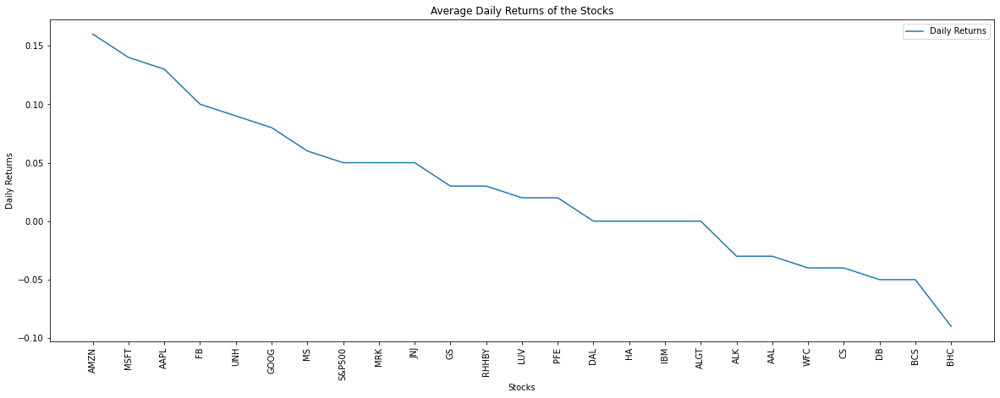

In [80]:
# Visualizing the Average Daily Returns of the Stocks

plt.figure(figsize=(20,7))

sns.lineplot(data = metrics['Avg Daily Returns'], label="Daily Returns")

plt.title('Average Daily Returns of the Stocks')
plt.xlabel("Stocks")   # X-aixs
plt.xticks(rotation = 90)   # x-labels will be seen vertically
plt.ylabel("Daily Returns")   # Y-axis
plt.show()

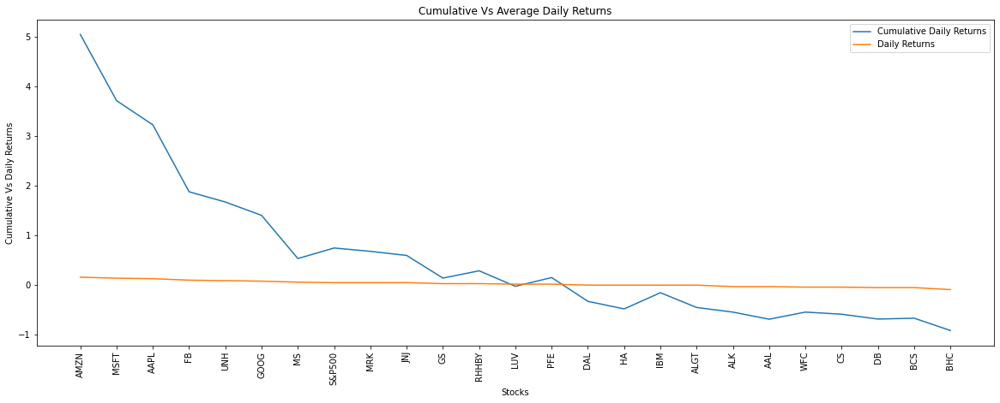

In [81]:
# Visualizing the Cumulative Returns vs Average Daily returns of the Stocks

plt.figure(figsize=(20,7))

sns.lineplot(data=metrics['Cumulative Returns']/100, label="Cumulative Daily Returns")
sns.lineplot(data=metrics['Avg Daily Returns'], label="Daily Returns")

plt.title('Cumulative Vs Average Daily Returns')
plt.xlabel("Stocks")   # X-aixs
plt.xticks(rotation = 90)   # x-labels will be seen vertically
plt.ylabel("Cumulative Vs Daily Returns")   # Y-axis
plt.show()

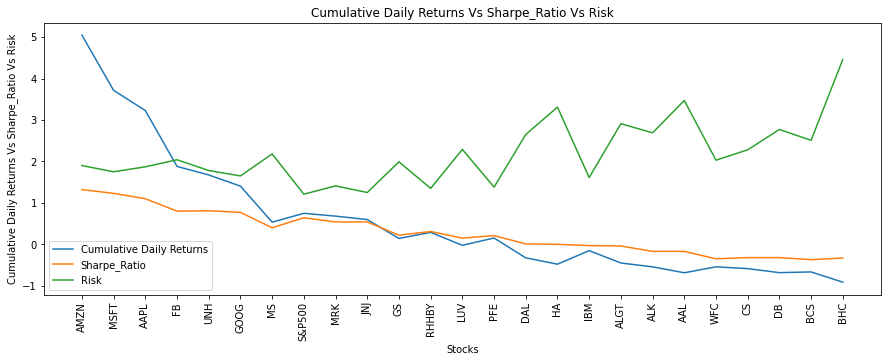

In [82]:
# Visualizing the Cumulative returns vs SHarpe Ratio vs Risk  of stocks

plt.figure(figsize=(15,5))

sns.lineplot(data=metrics['Cumulative Returns']/100, label="Cumulative Daily Returns")
sns.lineplot(data=metrics['Sharpe_Ratio'], label="Sharpe_Ratio")
sns.lineplot(data=metrics['Risk'], label="Risk")


plt.title('Cumulative Daily Returns Vs Sharpe_Ratio Vs Risk')
plt.xlabel("Stocks")   # X-aixs
plt.xticks(rotation = 90)   # x-labels will be seen vertically
plt.ylabel("Cumulative Daily Returns Vs Sharpe_Ratio Vs Risk")   # Y-axis
plt.show()

# Portfolio Analysis

## Mr. Patrick Jyengar Portfolio


According to Mr. Patrick Jyengar, he wants to double his investments in the span of 5 years with the minimum risk as possible considering he is retired.

Thus following his profile we will recommend him to invest in the stocks like JNJ, RHHBY and MRK. Considering the returns of these stocks. It is advisable for Mr. Patrick to invest in the Techology sector as it is booming with high returns  which can be beneficial of expected returns to Mr. Patrick


In [83]:
# Initial weight for each stock in order
stocks_patrick = ['MSFT', 'JNJ', 'RHHBY' ,'MRK']
 
initial_weight = np.array([0.25, 0.25, 0.25, 0.25])

In [84]:
# Creating a datasset for the selected stocks

patrick_portfolio = stock_data.copy()
patrick_portfolio = patrick_portfolio[stocks_patrick]

In [85]:
patrick_portfolio.tail()

,MSFT,JNJ,RHHBY,MRK
Date,,,,
2020-09-24,203.190002,144.669998,44.700001,83.150002
2020-09-25,207.820007,145.660004,44.820000,82.930000
2020-09-28,209.440002,147.110001,44.110001,82.760002
2020-09-29,207.259995,147.059998,43.369999,81.900002
2020-09-30,210.330002,148.880005,42.810001,82.949997


## Daily return from each stock

In [86]:
# Daily return from each stock 

returns_patrick = patrick_portfolio.pct_change()
returns_patrick.head(8)

,MSFT,JNJ,RHHBY,MRK
Date,,,,
2015-10-01,NaN,NaN,NaN,NaN
2015-10-02,0.021520,0.008157,0.003010,0.015597
2015-10-05,0.023261,0.008836,0.003601,0.021739
2015-10-06,0.002573,-0.014141,0.002691,-0.027913
2015-10-07,0.001069,0.016699,-0.029228,0.023092
2015-10-08,0.013889,0.001053,0.021505,0.001374
2015-10-09,-0.007165,0.003050,-0.011729,-0.001372
2015-10-12,-0.002335,0.006501,0.004260,-0.004711


### Average daily return from each stock

In [87]:
# Average daily return from each stock

avg_daily_returns_patrick = returns_patrick.mean()
print(avg_daily_returns_patrick)

MSFT     0.001387
JNJ      0.000451
RHHBY    0.000293
MRK      0.000511
dtype: float64


## Risk of Stocks in Portfolio

In [88]:
stock_risk = returns_patrick.std()

stock_risk

MSFT     0.017539
JNJ      0.012459
RHHBY    0.013514
MRK      0.014067
dtype: float64

## Daily returns from portfolio

In [89]:
# Daily Returns Portfolio for Patrick

returns_patrick['portfolio_daily_returns'] = returns_patrick.dot(initial_weight)

returns_patrick

,MSFT,JNJ,RHHBY,MRK,portfolio_daily_returns
Date,,,,,
2015-10-01,NaN,NaN,NaN,NaN,NaN
2015-10-02,0.021520,0.008157,0.003010,0.015597,0.012071
2015-10-05,0.023261,0.008836,0.003601,0.021739,0.014359
2015-10-06,0.002573,-0.014141,0.002691,-0.027913,-0.009197
2015-10-07,0.001069,0.016699,-0.029228,0.023092,0.002908
...,...,...,...,...,...
2020-09-24,0.012962,0.001592,-0.003567,0.006293,0.004320
2020-09-25,0.022787,0.006843,0.002685,-0.002646,0.007417
2020-09-28,0.007795,0.009955,-0.015841,-0.002050,-0.000035


## Total Portfolio Returns

In [90]:
# calculating the Total Protfolio Returns 

stock_returns_patrick = (initial_weight * avg_daily_returns_patrick)

portfolio_returns = np.sum(stock_returns_patrick)

portfolio_returns * 100

0.06603738600705664

#### Average Daily Returns of Portfolio is 0.06%

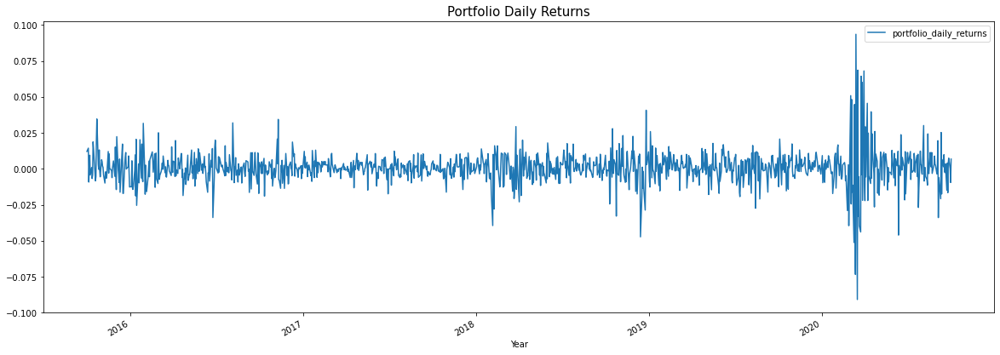

In [91]:
# Visulaizing the Portfolio Daily Returns

plt.figure(figsize=(20,7))

returns_patrick['portfolio_daily_returns'].plot()

plt.title('Portfolio Daily Returns', fontsize = 15)
plt.legend(loc = 'best', fontsize = 10)
plt.xlabel("Year")
plt.show()

## Cumulative return from the Portfolio

In [92]:
# Cumulative Returns

cum_returns_patrick = (1+returns_patrick).cumprod()
cum_returns_patrick.tail(5)

,MSFT,JNJ,RHHBY,MRK,portfolio_daily_returns
Date,,,,,
2020-09-24,4.554808,1.552753,1.345575,1.684221,2.106791
2020-09-25,4.658597,1.563379,1.349187,1.679765,2.122417
2020-09-28,4.694911,1.578942,1.327815,1.676322,2.122342
2020-09-29,4.646043,1.578405,1.305539,1.658902,2.102224
2020-09-30,4.714862,1.597939,1.288682,1.680170,2.116465


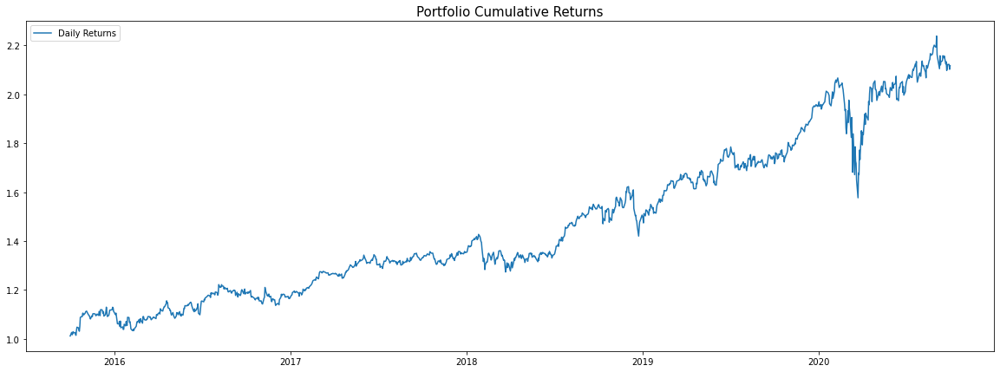

In [93]:
# Visualizing the cumulative Daily Returns

plt.figure(figsize=(20,7))
plt.plot(cum_returns_patrick['portfolio_daily_returns'], label = 'Daily Returns')
plt.title('Portfolio Cumulative Returns', fontsize = 15)
plt.legend(loc = 'best', fontsize = 10)
plt.show()

### Portfolio Risk – Portfolio Standard Deviation

For the portfolio standard deviation formula, we need three elements:

- Portfolio weight array
- Portfolio covariance matrix
- Transpose of portfolio weight array

The weight for each stock in the portfolio is already abailable. We need to calculate the daily covariance. Remember, the covariance must be annualised by **multiplying with 252 (the trading days in a year)**.

In [94]:
# Covariance matrix for the portfolio

# Removing the last column (Portfolio_Daily_Return) from our calculation.

covariance_matrix_portfolio = returns_patrick.iloc[:,:-1]
covariance_matrix_portfolio = (covariance_matrix_portfolio.cov())*252

covariance_matrix_portfolio

,MSFT,JNJ,RHHBY,MRK
MSFT,0.077524,0.028277,0.029796,0.029374
JNJ,0.028277,0.039117,0.019560,0.025844
RHHBY,0.029796,0.019560,0.046023,0.020306
MRK,0.029374,0.025844,0.020306,0.049865


In [95]:
# Applying the matrix operations mentioned in the image above
portfolio_variance = np.dot(initial_weight.T,np.dot(covariance_matrix_portfolio, initial_weight))

In [96]:
# Standard deviation (risk of portfolio)
portfolio_risk = np.sqrt(portfolio_variance)
portfolio_risk*100

18.00773538749593

### Sharpe Ratio

In [97]:
# Assuming that the risk free rate is zero

Sharpe_Ratio = (returns_patrick['portfolio_daily_returns'].mean() - daily_returns['S&P500'].mean()) / returns_patrick['portfolio_daily_returns'].std()

Sharpe_Ratio


0.012596079178261308

In [98]:
# Annual Sharpe Ratio

Annualised_Sharpe_Ratio = (252**0.5)*Sharpe_Ratio
Annualised_Sharpe_Ratio

0.1999565580009495

### Total ROI from the Portfolio

In [99]:
amount_patrick = 500000

cumulative_returns = cum_returns_patrick['portfolio_daily_returns'][-1]

expected_return_patrick = amount_patrick * cumulative_returns
expected_return_patrick

1058232.526596431

In [100]:
earnings_patrick = expected_return_patrick - amount_patrick
earnings_patrick

558232.5265964309

- From the above Portfolio build for Mr. Patrick Jyengar,  he gets the returns of 1.58 Million dollars with the gain of 558.232 Thousand dollars on the investments of 500 Thousand dollars for the period of 5 years.


## Mr. Peter Jyengar Portfolio Building


Mr. Peter Jyengar is open to the risk and is expecting high returns in investmensts possible as he is working towards expansion of the company.

As he is investing the amount of $1 million from the company's account, he is expecting the high returns and is able to handle the risk 
Accordingly, we can recommend him the stocks that are high risk - high return  like Amazon, google, Microsoft. This stocks are providing the highest returns compared to others with the relatable risk involved.


In [101]:
# Initial weight for each stock in order

stocks_peter = ['AMZN','MSFT']

initial_weight = np.array([0.5,0.5])

In [102]:
# Lets create a dataset for selected stocks

peter_portfolio = stock_data.copy()
peter_portfolio = peter_portfolio[stocks_peter]

In [103]:
peter_portfolio.tail()

,AMZN,MSFT
Date,,
2020-09-24,3019.790039,203.190002
2020-09-25,3095.129883,207.820007
2020-09-28,3174.050049,209.440002
2020-09-29,3144.879883,207.259995
2020-09-30,3148.729980,210.330002


### Daily return from each stock

In [104]:
# Daily return from each stock 

returns_peter = peter_portfolio.pct_change()
returns_peter.head(8)

,AMZN,MSFT
Date,,
2015-10-01,NaN,NaN
2015-10-02,0.022699,0.021520
2015-10-05,0.020919,0.023261
2015-10-06,-0.011404,0.002573
2015-10-07,0.008298,0.001069
2015-10-08,-0.016201,0.013889
2015-10-09,0.012454,-0.007165
2015-10-12,0.019248,-0.002335


### Average daily return from each stock

Average daily return for each stock can be calculated using the dataframe created above - "stocks_returns"

In [105]:
# Average daily return from each stock

avg_daily_stocks_peter = returns_peter.mean()
print(avg_daily_stocks_peter)

AMZN    0.001611
MSFT    0.001387
dtype: float64


## Risk of Stocks in Portfolio

In [106]:
stock_risk_peter = returns_peter.std()
stock_risk_peter

AMZN    0.018969
MSFT    0.017539
dtype: float64

### Daily return from the portfolio

The weighted average can be calculated to determine the return from the portfolio on a daily basis.

In [107]:
# Portfolio daily returns
returns_peter['portfolio_daily_returns'] = returns_peter.dot(initial_weight)
returns_peter

,AMZN,MSFT,portfolio_daily_returns
Date,,,
2015-10-01,NaN,NaN,NaN
2015-10-02,0.022699,0.021520,0.022110
2015-10-05,0.020919,0.023261,0.022090
2015-10-06,-0.011404,0.002573,-0.004415
2015-10-07,0.008298,0.001069,0.004684
...,...,...,...
2020-09-24,0.006644,0.012962,0.009803
2020-09-25,0.024949,0.022787,0.023868
2020-09-28,0.025498,0.007795,0.016647


### Total Portfolio Return

In [108]:
# We are calculating the total portfolio return

stocks_returns_peter = (initial_weight * avg_daily_stocks_peter)

portfolio_return_peter = np.sum(stocks_returns_peter)
portfolio_return_peter * 100

0.14987887457018706

Average Daily Returns of Portfolio is 0.16%

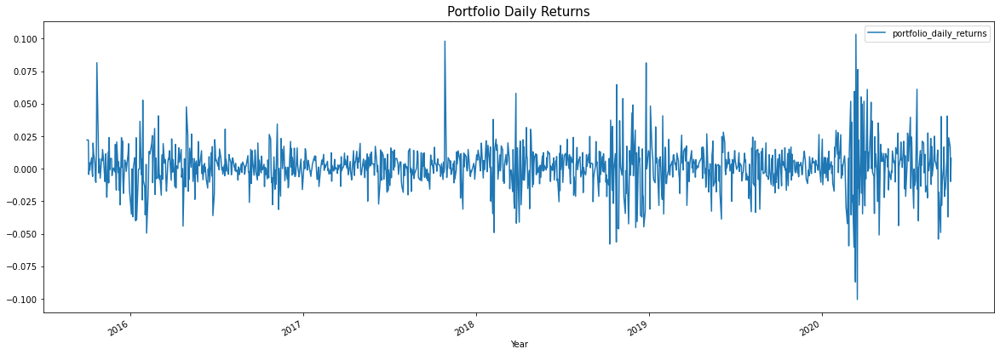

In [109]:
# Visualize the Potfolio Daily Returns

plt.figure(figsize=(20,7))

returns_peter['portfolio_daily_returns'].plot()
plt.title('Portfolio Daily Returns', fontsize = 15)
plt.legend(loc = 'best', fontsize = 10)
plt.xlabel("Year")
plt.show()

### Cumulative return from the Portfolio

In [110]:
# Cumulative return from the portfolio

cum_returns_peter = (1+returns_peter).cumprod()
cum_returns_peter.tail(5)

,AMZN,MSFT,portfolio_daily_returns
Date,,,
2020-09-24,5.799259,4.554808,5.316747
2020-09-25,5.943943,4.658597,5.443646
2020-09-28,6.095503,4.694911,5.534264
2020-09-29,6.039484,4.646043,5.480031
2020-09-30,6.046878,4.714862,5.523972


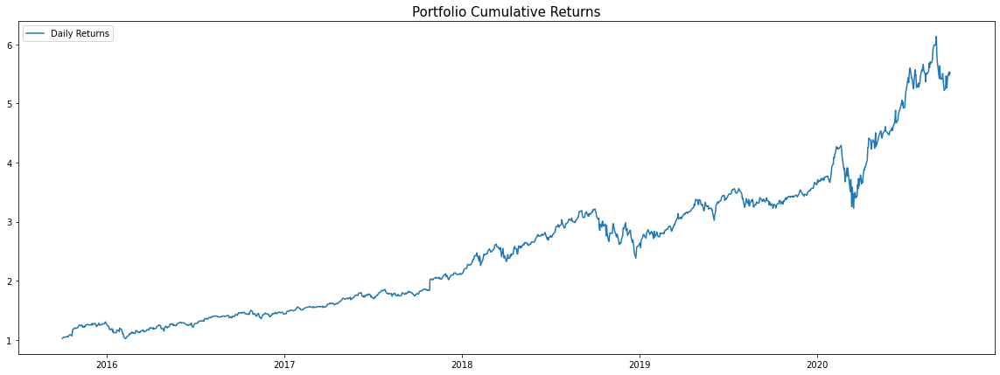

In [111]:
# Visualize the Potfolio Cumu;ative Returns

plt.figure(figsize=(20,7))

plt.plot(cum_returns_peter['portfolio_daily_returns'], label = 'Daily Returns')
plt.title('Portfolio Cumulative Returns', fontsize = 15)
plt.legend(loc = 'best', fontsize = 10)
plt.show()

### Portfolio Risk – Portfolio Standard Deviation

For the portfolio standard deviation formula, we need three elements:
- Portfolio weight array
- Portfolio covariance matrix
- Transpose of portfolio weight array

The weight for each stock in the portfolio is already abailable. We need to calculate the daily covariance. Remember, the covariance must be annualised by **multiplying with 252 (the trading days in a year)**.

In [112]:
# Covariance matrix for the portfolio

# Removing the last column (Portfolio_Daily_Return) from our calculation.

covariance_matrix_portfolio = returns_peter.iloc[:,:-1]
covariance_matrix_portfolio = (covariance_matrix_portfolio.cov())*252

covariance_matrix_portfolio

,AMZN,MSFT
AMZN,0.090671,0.056626
MSFT,0.056626,0.077524


In [113]:
# Applying the matrix operations mentioned in the image above
portfolio_variance = np.dot(initial_weight.T,np.dot(covariance_matrix_portfolio, initial_weight))

In [114]:
# Standard deviation (risk of portfolio)
portfolio_risk = np.sqrt(portfolio_variance)
portfolio_risk*100

26.525749564696515

### Sharpe Ratio

In [115]:
# Assuming that the risk free rate is zero
Sharpe_Ratio = (returns_peter['portfolio_daily_returns'].mean() - daily_returns['S&P500'].mean()) / returns_peter['portfolio_daily_returns'].std()
Sharpe_Ratio

0.05872668090632915

In [116]:
Annualised_Sharpe_Ratio = (252**0.5)*Sharpe_Ratio
Annualised_Sharpe_Ratio

0.9322571580143533

#### Total ROI from the Portfolio

In [117]:
amount_peter = 1000000

cumulative_returns_peter = cum_returns_peter['portfolio_daily_returns'][-1]

expected_return_peter =amount_peter * cumulative_returns_peter

expected_return_peter

5523971.805773486

In [118]:
earnings_peter = expected_return_peter - amount_peter

earnings_peter

4523971.805773486

- Mr.Peter jyengar have invested 1 Million dollar on equities. The returns he would get after 5 years is about 5.5 million dollar and the gain of about 4.5 million dollar.


- The risk obscured by having such high gain are about 26.5% overall.

# Conclusion


- In this Portfolio Project we have explored stock Prices of aviation, finance, pharma, technology sectors. We have seen various key metrics for understanding the returns values, the risk involved etc when investing in these stocks.

- Aviation  -- Delta Airlines and American Airlines are more correlated with Alska Air Group at third rank
- Finance -- Goldman Sachs, Morgan Stanley & WellsFargo  are ranking higher correlation with the market index
- Pharma -- Jhonsons and Jo=honsons and Pzier are more correalted, Comapred to the Other sectors Pharma is less correlated with the maket index
- Technology -- Microsoft and Google are the highhly correlated stocks with Amazon in the third rank

- Stocks with low risk and high Gain is best to buy. We have Jhonsons and Jhonson as such stock whereas Amazon is high risk high gain